In [2]:
library(dplyr)
library(ggplot2)
library(reshape2)
library(openxlsx)
library(cowplot)
library(ROCR)
library(ggpubr)
library(dplyr)
library(reshape2)
library(Rpdb)
library(gplots)
library(heatmaply)
library(ggrepel)

In [3]:
# install.packages('heatmaply')


# Load Spikes

## Load N-sites

In [4]:
# N-glycosites: https://www.biorxiv.org/content/10.1101/2021.03.08.433764v1.full
nsites=c(17,61,74,122,149,165,234,282,331,343,603,616,657,709,717,801,1074,1098,1134,1158,1173,1194)

## Load spike sequences

In [5]:
tmp=apply(read.xlsx('InSaNNE_standalone/files/results/SPIKE_Validation/Results_07Oct2021_Ben_NateUCSD_Saby_Yates.xlsx',sheet=1)[,4:12],2,function(x){
  gsub('xx','',paste0( na.omit( x ) , collapse='') )
})
write.table(tmp,'InSaNNE_standalone/files/results/SPIKE_Validation/Results_07Oct2021_Ben_NateUCSD_Saby_Yates.seqs',quote=F,col.names=F)

In [6]:
tmp
s1_sites = nsites[nsites<700]
s1d_sites = ifelse(s1_sites>158,s1_sites-2,s1_sites)
sapply(s1_sites,function(ni) {c(ni,substr(tmp[4],ni,ni)) } )
sapply(s1_sites,function(ni) {c(ni,substr(tmp[5],ni,ni)) } )
sapply(s1_sites,function(ni) {c(ni,substr(tmp[7],ni,ni)) } )
sapply(s1d_sites,function(ni) {c(ni,substr(tmp[9],ni,ni)) } )

N501Y.RBD 
                                                                                                                                                                                                                                                                                                                                                                                                                                                                              "RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCVADYSVLYNSASFSTFKCYGVSPTKLNDLCFTNVYADSFVIRGDEVRQIAPGQTGKIADYNYKLPDDFTGCVIAWNSNNLDSKVGGNYNYLYRLFRKSNLKPFERDISTEIYQAGSTPCNGVEGFNCYFPLQSYGFQPTYGVGYQPYRVVVLSFELLHAPATVCGPKKSTNLVKNKCVNF" 
                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                      F342L.RBD 
                                                                                                                                                                                                                                                                                                                                                                                                                                                                              "RVQPTESIVRFPNITNLCPFGEVLNATRFASVYAWNRKRISNCVADYSVLYNSASFSTFKCYGVSPTKLNDLCFTNVYADSFVIRGDEVRQIAPGQTGKIADYNYKLPDDFTGCVIAWNSNNLDSKVGGNYNYLYRLFRKSNLKPFERDISTEIYQAGSTPCNGVEGFNCYFPLQSYGFQPTNGVGYQPYRVVVLSFELLHAPATVCGPKKSTNLVKNKCVNF" 
                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                            RBD 
                                                                                                                                                                                                                                                                                                                                                                                                                                                                              "RVQPTESIVRFPNITNLCPFGEVFNATRFASVYAWNRKRISNCVADYSVLYNSASFSTFKCYGVSPTKLNDLCFTNVYADSFVIRGDEVRQIAPGQTGKIADYNYKLPDDFTGCVIAWNSNNLDSKVGGNYNYLYRLFRKSNLKPFERDISTEIYQAGSTPCNGVEGFNCYFPLQSYGFQPTNGVGYQPYRVVVLSFELLHAPATVCGPKKSTNLVKNKCVNF" 
                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                

,17,61,74,122,149,165,234,282,331,343,603,616,657
S1,N,N,N,N,N,N,N,N,N,N,N,N,N


,17,61,74,122,149,165,234,282,331,343,603,616,657
D614G.S1,N,N,N,N,N,N,N,N,N,N,N,N,N


,17,61,74,122,149,165,234,282,331,343,603,616,657
Gamma.S1,N,N,N,N,N,N,N,N,N,N,N,N,N


,17,61,74,122,149,163,232,280,329,341,601,614,655
Delta.S1,N,N,N,N,N,N,N,N,N,N,N,N,N


## Load mutations

In [7]:
# glycoimpact scores
glycoimpact_0.01 = read.csv('../GTspecificity/GTspecifity_paper/Template paper/supplemental/Data/03.Glycan_Protein_Relations/results/glyco_impact/glyco_impact.0.01.csv')
glycoimpact_0.1  = read.csv('../GTspecificity/GTspecifity_paper/Template paper/supplemental/Data/03.Glycan_Protein_Relations/results/glyco_impact/glyco_impact.0.1.csv')
glycoimpact_1    = read.csv('../GTspecificity/GTspecifity_paper/Template paper/supplemental/Data/03.Glycan_Protein_Relations/results/glyco_impact/glyco_impact.1.csv')

deletion_lookup = list(R157X='F157V',V158X='R158Y')

muts='D614G,N501Y,V341I,A344S,F342L,H69X,V70X,Y144X,A570D,P681H,L18F, T20N,
    P26S, D138Y, R190S, K417T, E484K, N501Y, D614G, H655Y,T19R, G142D, E156G, F157V,R158Y, L452R, T478K, D614G, P681R'
UK = sapply(strsplit('H69X,V70X, Y144X, N501Y, A570D, D614G, P681H',','),trimws)
Bz = sapply(strsplit('L18F, T20N, P26S, D138Y, R190S, K417T, E484K, N501Y, D614G, H655Y',','),trimws)
In = sapply(strsplit('T19R, G142D, E156G, F157V,R158Y, L452R, T478K, D614G, P681R',','),trimws)

muts = unique(lapply(strsplit(muts,','),function(x){
  x = trimws(x)
  wt = substr(x,1,1)
  mt = substr(x,nchar(x),nchar(x))
  idx = as.numeric(substr(x,2,nchar(x)-1))
  data.frame(x,wt,mt,idx)
  })[[1]])
muts = muts[order(muts$idx),]

muts$UK = muts$x%in%UK
muts$Brazil = muts$x%in%Bz
muts$India = muts$x%in%In

muts = muts[order(muts$idx),]

head(muts)

,x,wt,mt,idx,UK,Brazil,India
,<chr>,<chr>,<chr>,<dbl>,<lgl>,<lgl>,<lgl>
11,L18F,L,F,18,FALSE,TRUE,FALSE
21,T19R,T,R,19,FALSE,FALSE,TRUE
12,T20N,T,N,20,FALSE,TRUE,FALSE
13,P26S,P,S,26,FALSE,TRUE,FALSE
6,H69X,H,X,69,TRUE,FALSE,FALSE
7,V70X,V,X,70,TRUE,FALSE,FALSE


## Load structure

In [8]:
eucl_dist3d_min<-function(i,j,x){
    if(!all(c(i,j)%in%x$atoms$resid)){return(NA)}
    idx_i = x$atoms$resid==i 
    idx_j = x$atoms$resid==j 
    #as.vector(dist(as.data.frame(lapply(distances(x, idx_i, idx_j),as.vector))))
    as.vector(min(norm(distances(x,idx_i,idx_j),'xyz')))
}

res2all_dist <-function(sites,pdb){
    dist=sapply( sites , function(i){
            sapply( unique(pdb$atoms$resid) , function(j){
                eucl_dist3d_min(i,j,pdb)
    })})
}

strwd = 'InSaNNE_standalone/files/results//SPIKE_Validation//structures_alphafold2/'
str_prefix = c('prediction_delta','prediction_gamma','prediction_D614G','prediction_S1')

# load structure
str_all_s1 = lapply(str_prefix,function(prfx){ read.pdb(file.path(strwd,prfx,'/selected_prediction.pdb')) })
names(str_all_s1) = str_prefix

# get dist to glycosites
dist_all_s1 = lapply(str_prefix,function(prfx){
    if(grepl('delta',prfx)){
        res2all_dist(s1d_sites,str_all_s1[[prfx]])
    }else{
        res2all_dist(s1_sites,str_all_s1[[prfx]])
    }
})
names(dist_all_s1) = str_prefix


# gamma_str = read.pdb(paste0(strwd,'prediction_gamma/selected_prediction.pdb'))
# gamma_dist=sapply( s1_sites , function(i){
#     sapply( unique(gamma_str$atoms$resid) , function(j){
#         eucl_dist3d_min(i,j,gamma_str)
#     })      
# })



In [9]:
###closest mutations to each site???

apply(dist_all_s1$prediction_S1,2,function(x) sort(x,decreasing = F)[1:10])
apply(dist_all_s1$prediction_S1,2,function(x) order(x,decreasing = F)[1:10])

0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1.333522,1.330561,1.337781,1.333221,1.337859,1.335640,1.331974,1.333801,1.330805,1.336989,1.333891,1.331476,1.337295
1.335915,1.332729,1.338779,1.338661,1.340717,1.337844,1.332928,1.336213,1.334168,1.339198,1.336684,1.334050,1.339673
2.047333,2.434754,2.590611,1.843807,1.750588,1.837168,2.074715,2.483020,3.590310,1.921005,2.778181,1.934771,2.265760
2.858617,2.573816,2.789604,2.019594,2.861295,2.401442,3.087748,2.488717,3.672121,3.232506,3.569270,2.469994,2.972130
2.870524,2.969670,5.415471,2.538678,3.122685,3.012881,3.110895,2.755577,3.879426,3.321987,3.807296,2.482539,6.557957
4.206521,3.781090,5.554920,2.905397,3.181825,3.131228,3.408742,3.822276,4.213515,3.690019,3.950257,2.782628,6.716883
5.260431,4.069136,5.960148,3.248996,5.742277,4.318892,4.006779,4.806325,5.559967,3.777545,5.047938,3.287226,7.058946
5.533990,4.094429,7.333600,3.336108,6.082342,4.648094,5.024636,4.863640,5.987273,4.013853,5.111121,4.042274,8.166764
5.853966,4.128555,8.097862,3.527473,6.836848,5.485373,5.428191,5.572168,6.140548,4.284610,5.198454,4.362296,8.225691


17,61,74,122,149,165,234,282,331,343,603,616,657
18,62,75,121,148,166,235,283,332,342,602,617,658
16,60,73,123,150,164,233,281,330,344,604,615,656
137,28,76,125,146,132,108,280,580,339,601,619,655
19,29,72,124,151,115,196,43,329,341,307,644,659
138,30,70,154,147,131,236,284,333,345,605,620,660
15,31,77,141,153,167,107,45,579,340,308,618,654
140,59,71,157,145,130,232,46,530,338,309,649,685
20,63,78,120,152,163,115,44,334,371,682,614,643
136,268,69,127,144,168,237,279,362,347,600,648,661


## Load glycosylation observations

In [10]:
wd='InSaNNE_standalone/files/'
res = read.csv(file.path(wd,'results/SPIKE_Validation/Results_07Oct2021_Ben_NateUCSD_Saby_Yates.csv')) 
head(res)

,Variant,Replicate,Amino.acid.,N.glycosylation.site.,SpectralCounts.Total,Peptides.Total,MeanProp.unoccupied,SEMProp.unoccupied,SpectralCounts.Unoccupied,Peptides.Unoccupied,MeanProp.Complex,SEMProp.Complex,SpectralCounts.Complex,Peptides.Complex,MeanProp.HighMannose,SEMProp.HighMannose,SpectralCounts.HighMannose,Peptides.HighMannose
,<chr>,<int>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<int>,<int>
1,RBD,1,13,331,234,46,0.02346,0.01432,20,5,0.92486,0.04151,187,32,0.05169,0.02856,32,9
2,RBD,1,25,343,103,31,0.00032,0.00032,2,1,0.97013,0.01557,86,23,0.02955,0.01556,20,7
3,RBD_A344S,1,13,331,176,42,0.00051,0.00039,10,3,0.99187,0.00461,144,34,0.00762,0.00456,22,5
4,RBD_A344S,1,25,343,97,30,0.00035,0.00035,1,1,0.99490,0.00348,86,26,0.00475,0.00337,10,3
5,RBD_F342L,1,13,331,260,44,0.00634,0.00630,12,2,0.96973,0.02600,232,36,0.02393,0.01975,16,6
6,RBD_F342L,1,25,343,142,31,0.00025,0.00025,2,1,0.94641,0.04538,133,26,0.05334,0.04539,7,4


In [11]:
meanprop = melt(res,id.vars = c('Variant','N.glycosylation.site.','Replicate'),value.name = 'MeanProp',variable.name = 'type',
                measure.vars = c('MeanProp.unoccupied','MeanProp.Complex','MeanProp.HighMannose'))
meanprop$type = gsub('MeanProp.','',meanprop$type)
semprop = melt(res,id.vars = c('Variant','N.glycosylation.site.','Replicate'),value.name = 'SEM',variable.name = 'type',
                measure.vars = c('SEMProp.unoccupied','SEMProp.Complex','SEMProp.HighMannose'))
semprop$type = gsub('SEMProp.','',semprop$type)
prop = merge(meanprop,semprop)
head(prop)

,Variant,N.glycosylation.site.,Replicate,type,MeanProp,SEM
,<chr>,<int>,<int>,<chr>,<dbl>,<dbl>
1,RBD,331,1,Complex,0.92486,0.04151
2,RBD,331,1,HighMannose,0.05169,0.02856
3,RBD,331,1,unoccupied,0.02346,0.01432
4,RBD,343,1,Complex,0.97013,0.01557
5,RBD,343,1,HighMannose,0.02955,0.01556
6,RBD,343,1,unoccupied,0.00032,0.00032


## Load glycosylation observation comparisons

In [100]:
fn=grep( '_S1', list.files(dir_i<-file.path(wd,'results/SPIKE_Validation/comparisons')),value=T)
fn
comp = do.call(rbind,lapply(fn,function(fni){

    dat=read.csv(file.path(dir_i,fni),sep='\t') %>% 
        mutate(
            PTM = as.character(ifelse(PTM==0,'unoccupied',
                                         ifelse(PTM==203.079,'HighMannose','Complex'))),
               group1=gsub('^[1-9]_|-2','',gsub('_vs_.*','',fni)),
               group2=gsub('^[1-9]_|-2','',gsub('.*_vs_','',gsub('.tsv','',fni)))
               )
    if('Ref..Position'%in%colnames(dat)){
        dat$Position = dat$Ref..Position
        dat = dat[,which(colnames(dat)!='Ref..Position')]
    }
    dat
}))
head(comp)

[1] "4_S1_vs_5_S1_D614G.tsv"       "4_S1_vs_7_S1_Gamma.tsv"      
[3] "4_S1_vs_9_S1_Delta.tsv"       "4_S1-2_vs_5_S1-2_D614G.tsv"  
[5] "4_S1-2_vs_7_S1-2_Gamma.tsv"   "4_S1-2_vs_9_S1-2_Delta.tsv"  
[7] "5_S1_D614G_vs_7_S1_Gamma.tsv"

,Position,PTM,X..1,X..2,SEM.1,SEM.2,p.value,Adj..p.value,Sign.,X,group1,group2
,<int>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<lgl>,<chr>,<chr>
1,61,unoccupied,0.000000e+00,6.878529e-04,0.000000e+00,5.753225e-04,0.4478699,1,NA,NA,S1,S1_D614G
2,61,Complex,9.920344e-01,9.968711e-01,6.176206e-03,1.158724e-03,0.5917240,1,NA,NA,S1,S1_D614G
3,61,HighMannose,7.965571e-03,2.441096e-03,6.176206e-03,1.019562e-03,0.9294422,1,NA,NA,S1,S1_D614G
4,74,unoccupied,1.918379e-05,3.438645e-05,1.918379e-05,3.438645e-05,0.9888396,1,NA,NA,S1,S1_D614G
5,74,Complex,9.962537e-01,9.913436e-01,1.380632e-03,7.567249e-03,0.5641203,1,NA,NA,S1,S1_D614G
6,74,HighMannose,3.727132e-03,8.621984e-03,1.376961e-03,7.567370e-03,0.5626672,1,NA,NA,S1,S1_D614G


In [ ]:
comp2 = comp %>% group_by(Position,PTM,group1,group2) %>%
    summarise(
        X..1 = mean(X..1),
        X..2 = mean(X..2),
        SEM.1 = mean(SEM.1),
        SEM.2 = mean(SEM.2),
        p.value = pchisq( -2*sum(log(p.value)) , df=2*2 ,lower.tail = F )
        )
head(comp2)

## Load IMRs

In [13]:
## high-mannose by aa
#trends = read.csv('GTspecifity_paper/Template paper/supplemental/Data/03.Glycan_Protein_Relations/results/glycan_protein_relations.all.20210328_1509.csv')
trends = openxlsx::read.xlsx('GTspecifity_paper/Template paper/supplemental/Data/03.Glycan_Protein_Relations/results/glycan_protein_relations.all.xlsx')
trends = trends %>% mutate(fisher_OR.odds.ratio = as.numeric(as.character(fisher_OR.odds.ratio)))
head(trends)

,motif,glycoct,6-a-Glc3S,Fuc,Gal,Gal2NAc,Gal2NAc(4S),Gal3S,Gal4S,Gal6S,⋯,pvT_gvn_gvF,pvF_gvn_gvF,gvT_gvn_pvT,gvF_gvn_pvT,gvT_gvn_pvF,gvF_gvn_pvF,mutualinformation,conditionalentropy_12,conditionalentropy_21,conditionalentropy_df
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,X1,RES 1b:a-lgal-HEX-1:5|6:d LIN,0,1,0,0,0,0,0,0,⋯,0.5907859,0.4092141,0.5898401,0.4101599,0.5438066,0.4561934,0.001021917,0.6648568,0.6816706,1.347549
2,X1,RES 1b:a-lgal-HEX-1:5|6:d LIN,0,1,0,0,0,0,0,0,⋯,0.3536585,0.6463415,0.6104478,0.3895522,0.5478673,0.4521327,0.001907037,0.6661226,0.6807855,1.348815
3,X1,RES 1b:a-lgal-HEX-1:5|6:d LIN,0,1,0,0,0,0,0,0,⋯,0.3699187,0.6300813,0.5293103,0.4706897,0.5938865,0.4061135,0.001894955,0.6366095,0.6807976,1.319302
4,X1,RES 1b:a-lgal-HEX-1:5|6:d LIN,0,1,0,0,0,0,0,0,⋯,0.4173442,0.5826558,0.5375375,0.4624625,0.5939566,0.4060434,0.001538193,0.6654273,0.6811544,1.348120
5,X1,RES 1b:a-lgal-HEX-1:5|6:d LIN,0,1,0,0,0,0,0,0,⋯,0.4430894,0.5569106,0.4400685,0.5599315,0.6397897,0.3602103,0.018181950,0.6218875,0.6645106,1.304580
6,X1,RES 1b:a-lgal-HEX-1:5|6:d LIN,0,1,0,0,0,0,0,0,⋯,0.3211382,0.6788618,0.6152597,0.3847403,0.5482417,0.4517583,0.002116328,0.6496159,0.6805762,1.332308


## Load InSaNNe

In [14]:
# insanne site predictions
insane = read.csv('../GTspecificity/InSaNNE_standalone/files/data-intermediate/SARS_CoV_2_spike.wt_pred.csv')
head(insane)

,X,Glycan,pp_base,mean,sd,t,p,q,signif,logfc,site,high_mannose,lab,Mannose_perc,NeuNAc,Gal,Man
,<int>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>
1,0,Fuc(a1-2)Gal(b1-3)GalNAc,0.008405635,0.018289408,0.02831862,-3.490204,7.222586e-04,1.315354e-03,True,-1.1215797,17,0,complex,4,0,1,0
2,1,Fuc(a1-2)Gal(b1-4)GlcNAc(b1-2)Man(bond)[Gal(b1-4)GlcNAc(b1-2)Man(bond)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-6)]GlcNAc,0.002719015,0.011139120,0.01744796,-4.825840,5.067156e-06,1.943497e-05,True,-2.0344794,17,0,complex,4,0,2,3
3,2,Fuc(a1-2)Gal(b1-4)GlcNAc(b1-6)[Gal(b1-3)]GalNAc,0.203160345,0.173052587,0.12910513,2.332034,2.172454e-02,2.830429e-02,True,0.2314083,17,0,complex,4,0,2,0
4,3,Fuc(a1-4)GlcNAc(b1-6)[Fuc(a1-4)GlcNAc(b1-3)Gal(b1-3)]GalNAc,0.002164227,0.005558212,0.01148821,-2.954320,3.915392e-03,6.030187e-03,True,-1.3607691,17,0,complex,4,0,1,0
5,4,Gal(a1-3)Gal(b1-4)GlcNAc(b1-2)Man(a1-6)[Gal(a1-3)Gal(b1-4)GlcNAc(b1-4)[NeuNAc(bond)Gal(b1-4)GlcNAc(b1-2)]Man(a1-3)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-6)]GlcNAc,0.030376976,0.084766206,0.09530666,-5.706761,1.202630e-07,1.224719e-06,True,-1.4805110,17,0,complex,4,1,5,3
6,5,Gal(a1-3)Gal(b1-4)GlcNAc(b1-2)Man(a1-6)[NeuNAc(bond)Gal(b1-4)GlcNAc(b1-4)[Gal(a1-3)Gal(b1-4)GlcNAc(b1-2)]Man(a1-3)]Man(b1-4)GlcNAc(b1-4)[Fuc(a1-6)]GlcNAc,0.030376976,0.084766206,0.09530666,-5.706761,1.202630e-07,1.224719e-06,True,-1.4805110,17,0,complex,4,1,5,3


# Prepare data

## Annotate mutations

In [15]:
# muts$closest=sapply( 1:nrow(muts),function(i){
#   prox = nsites-muts$idx[i]
#   prox_i = prox[which.min(abs(prox))]
#   if(abs(prox_i)>20){
#     return(NA)
#   }
#   prox_i
# })

# muts$dir = ifelse(muts$closest>0,'aaUp','aaDown')

In [16]:
hy_ol=trends %>% filter(sequon=='ASN' & grepl('^aa',tool) & Man>3 & !is.na(Man)  & FDR_fisher_p<1 ) %>%
      #mutate(Man_fact = cut(Man,c(2,3,8))) %>%
      group_by(measure,tool) %>% 
        summarise(median=median(fisher_OR.odds.ratio,na.rm=T))

`summarise()` has grouped output by 'measure'. You can override using the `.groups` argument.



In [17]:


r = glycoimpact_0.01
# r = glycoimpact_0.1
# r = glycoimpact_1

### general glycoimpact
muts$glycoimpact_seq=sapply( 1:nrow(muts),function(i){
    sel = r$Var1==muts$wt[i] & r$v1_type%in%c('aaAll')
    max(r$glyco_dist[sel & r$Var2==muts$mt[i] ])
})

muts$glycoimpact_up=sapply( 1:nrow(muts),function(i){
    sel = r$Var1==muts$wt[i] & r$v1_type%in%c('aaUp')
    max(r$glyco_dist[sel & r$Var2==muts$mt[i] ])
})

muts$glycoimpact_down=sapply( 1:nrow(muts),function(i){
    sel = r$Var1==muts$wt[i] & r$v1_type%in%c('aaDown')
    max(r$glyco_dist[sel & r$Var2==muts$mt[i] ])
})


muts$glycoimpact_str=sapply( 1:nrow(muts),function(i){
    sel = r$Var1==muts$wt[i] & r$v1_type%in%c('aa')
    max(r$glyco_dist[sel & r$Var2==muts$mt[i] ])
})

## mannose glycoimpact
muts$mannoseimpact_seq=unlist(sapply( 1:nrow(muts),function(i){
  sel1 = hy_ol$measure==muts$wt[i] & hy_ol$tool=='aaAll'
  sel2 = hy_ol$measure==muts$mt[i] & hy_ol$tool=='aaAll'
    max(abs(hy_ol$median[sel2]-hy_ol$median[sel1]))
}))

muts$mannoseimpact_up=unlist(sapply( 1:nrow(muts),function(i){
  sel1 = hy_ol$measure==muts$wt[i] & hy_ol$tool=='aaUp'
  sel2 = hy_ol$measure==muts$mt[i] & hy_ol$tool=='aaUp'
    max(abs(hy_ol$median[sel2]-hy_ol$median[sel1]))
}))

muts$mannoseimpact_down=unlist(sapply( 1:nrow(muts),function(i){
  sel1 = hy_ol$measure==muts$wt[i] & hy_ol$tool=='aaDown'
  sel2 = hy_ol$measure==muts$mt[i] & hy_ol$tool=='aaDown'
    max(abs(hy_ol$median[sel2]-hy_ol$median[sel1]))
}))

muts$mannoseimpact_str=unlist(sapply( 1:nrow(muts),function(i){
  sel1 = hy_ol$measure==muts$wt[i] & hy_ol$tool=='aa'
  sel2 = hy_ol$measure==muts$mt[i] & hy_ol$tool=='aa'
    max(abs(hy_ol$median[sel2]-hy_ol$median[sel1]))
}))

muts$High_Impact = ifelse(muts$glycoimpact_seq>2.5 | muts$glycoimpact_str>2.5,1,NA)

muts$glycoimpact_seq[!is.finite(muts$glycoimpact_seq)]=NA
muts$glycoimpact_str[!is.finite(muts$glycoimpact_str)]=NA
muts$mannoseimpact_seq[!is.finite(muts$mannoseimpact_seq)]=NA
muts$mannoseimpact_str[!is.finite(muts$mannoseimpact_str)]=NA

muts = muts[order(muts$idx),]
head(muts)
# write.csv(muts,file='~/../Downloads/spike_mut_idx.csv',na = '')

Warning message in max(r$glyco_dist[sel & r$Var2 == muts$mt[i]]):
“no non-missing arguments to max; returning -Inf”
Warning message in max(r$glyco_dist[sel & r$Var2 == muts$mt[i]]):
“no non-missing arguments to max; returning -Inf”
Warning message in max(r$glyco_dist[sel & r$Var2 == muts$mt[i]]):
“no non-missing arguments to max; returning -Inf”
Warning message in max(r$glyco_dist[sel & r$Var2 == muts$mt[i]]):
“no non-missing arguments to max; returning -Inf”
Warning message in max(r$glyco_dist[sel & r$Var2 == muts$mt[i]]):
“no non-missing arguments to max; returning -Inf”
Warning message in max(r$glyco_dist[sel & r$Var2 == muts$mt[i]]):
“no non-missing arguments to max; returning -Inf”
Warning message in max(r$glyco_dist[sel & r$Var2 == muts$mt[i]]):
“no non-missing arguments to max; returning -Inf”
Warning message in max(r$glyco_dist[sel & r$Var2 == muts$mt[i]]):
“no non-missing arguments to max; returning -Inf”
Warning message in max(r$glyco_dist[sel & r$Var2 == muts$mt[i]]):
“no no

,x,wt,mt,idx,UK,Brazil,India,glycoimpact_seq,glycoimpact_up,glycoimpact_down,glycoimpact_str,mannoseimpact_seq,mannoseimpact_up,mannoseimpact_down,mannoseimpact_str,High_Impact
,<chr>,<chr>,<chr>,<dbl>,<lgl>,<lgl>,<lgl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
11,L18F,L,F,18,FALSE,TRUE,FALSE,0.9663272,0.8957942,-0.1846960,6.7842877,0.2641656,1.0408849,0.46809815,0.71632319,1
21,T19R,T,R,19,FALSE,FALSE,TRUE,3.3090077,-0.8907057,0.4777691,1.7704629,0.3612620,0.1270555,0.79778334,0.01992385,1
12,T20N,T,N,20,FALSE,TRUE,FALSE,2.9341198,-0.9339116,1.8871521,NA,NA,0.8140547,0.29735148,NA,1
13,P26S,P,S,26,FALSE,TRUE,FALSE,0.3108078,-0.2087226,1.2719262,-0.5361729,0.5667388,0.2502549,0.09785197,0.55631160,NA
6,H69X,H,X,69,TRUE,FALSE,FALSE,NA,-Inf,-Inf,NA,NA,-Inf,-Inf,NA,NA
7,V70X,V,X,70,TRUE,FALSE,FALSE,NA,-Inf,-Inf,NA,NA,-Inf,-Inf,NA,NA


# Glycosite-proximal mutations

## Proximity vs. glycoimpact
Are proximal mutations associated with differential glycosylation?

In [30]:
options(repr.plot.width = 15, repr.plot.height = 15)

##### Brazil/Gamma
mutated=muts$idx[ muts$Brazil  ] 
# glycoimpact_brazil = apply(muts[muts$Brazil,c('glycoimpact_seq','glycoimpact_str')],1,max,rm.na=T)
# colorRamp

# ht=heatmap.2(t((1/dist_all_s1$prediction_gamma[ mutated , ])),col=topo.colors,Rowv = F,Colv=F,
#              colSideColors = ifelse(muts$High_Impact[muts$Brazil]==1,'black','white'),
#              labCol = muts$x[ muts$Brazil  ],
#              labRow = s1_sites,cexRow=2,cexCol=2,mar=c(10,10))

palette = rev(topo.colors(10))
ramp = colorRampPalette(palette, bias = 8)

heatmaply(t((dist_all_s1$prediction_gamma[ mutated , ])),
            # col_side_colors = muts[muts$Brazil,
            #     c('glycoimpact_up','glycoimpact_down','glycoimpact_str',
            #       'mannoseimpact_up','mannoseimpact_down','mannoseimpact_str')],
            col=ramp,
            #col_side_palette=gplots::bluered,
            Rowv = F,Colv=F,
            labCol = muts$x[ muts$Brazil  ],
            labRow = s1_sites#,cexRow=1.5,cexCol=1.5
)



HTML widgets cannot be represented in plain text (need html)

In [20]:
# muts_keep = data.matrix(dist_all_s1$prediction_gamma[ mutated , ])
# rownames(muts_keep) = muts$x[ muts$Brazil  ]
# colnames(muts_keep) = s1_sites
# muts_keep=merge(muts,melt(muts_keep),by.x='x',by.y='Var1')
# head(muts_keep)

# diff = muts_keep$Var2 - muts_keep$idx
# muts_keep$dir = ifelse( abs(diff)>15, 'aa' ,
#                        ifelse( diff>0 , 'down' , 'up'))
# muts_keep$glycoimpact_combined = ifelse( muts_keep$dir == 'aa' , muts_keep$glycoimpact_str ,
#                                         ifelse( muts_keep$dir == 'down' , 
#                                                muts_keep$glycoimpact_down, muts_keep$glycoimpact_up))
# muts_keep$mannoseimpact_combined = ifelse( muts_keep$dir == 'aa' , muts_keep$mannoseimpact_str ,
#                                         ifelse( muts_keep$dir == 'down' , 
#                                                muts_keep$mannoseimpact_down, muts_keep$mannoseimpact_up))

# options(repr.plot.width = 15, repr.plot.height = 10)

# muts_keep%>%filter(Brazil)%>%
#     ggplot(aes(x=value,y=glycoimpact_combined,shape=dir))+
#         geom_point(color='black')+ylab('glycoimpact')+xlab('Distance to glycosite (Angstrom)')+
#         geom_text_repel(aes(y=glycoimpact_combined,label=ifelse(value<20 & glycoimpact_combined>0,x,NA)),color='black')+
#         scale_x_continuous(trans='log10')+#geom_hline(yintercept = 2.5)+
#         theme_bw(base_size = 20)+facet_wrap(~Var2)

# muts_keep%>%filter(Brazil)%>%
#     ggplot(aes(x=value,y=mannoseimpact_combined))+
#         geom_point(color='blue')+ylab('mannoseimpact')+xlab('Distance to glycosite (Angstrom)')+
#         geom_text_repel(aes(label=ifelse(value<20 & abs(mannoseimpact_combined)>.9,x,NA)),color='blue')+
#         scale_x_continuous(trans='log10')+#geom_hline(yintercept = 2.5)+
#         theme_bw(base_size = 20)+facet_wrap(~Var2)

[1] 2

,x,wt,mt,idx,UK,Brazil,India,glycoimpact_seq,glycoimpact_up,glycoimpact_down,glycoimpact_str,mannoseimpact_seq,mannoseimpact_up,mannoseimpact_down,mannoseimpact_str,High_Impact,Var2,value
,<chr>,<chr>,<chr>,<dbl>,<lgl>,<lgl>,<lgl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>
1,D138Y,D,Y,138,FALSE,TRUE,FALSE,-0.7277393,-0.9288437,-0.898705,-1.399865,0.7551515,0.7753453,1.028124,0.3698629,NA,61,23.636788
2,D138Y,D,Y,138,FALSE,TRUE,FALSE,-0.7277393,-0.9288437,-0.898705,-1.399865,0.7551515,0.7753453,1.028124,0.3698629,NA,165,20.165971
3,D138Y,D,Y,138,FALSE,TRUE,FALSE,-0.7277393,-0.9288437,-0.898705,-1.399865,0.7551515,0.7753453,1.028124,0.3698629,NA,343,31.915454
4,D138Y,D,Y,138,FALSE,TRUE,FALSE,-0.7277393,-0.9288437,-0.898705,-1.399865,0.7551515,0.7753453,1.028124,0.3698629,NA,17,2.412709
5,D138Y,D,Y,138,FALSE,TRUE,FALSE,-0.7277393,-0.9288437,-0.898705,-1.399865,0.7551515,0.7753453,1.028124,0.3698629,NA,149,24.912548
6,D138Y,D,Y,138,FALSE,TRUE,FALSE,-0.7277393,-0.9288437,-0.898705,-1.399865,0.7551515,0.7753453,1.028124,0.3698629,NA,331,37.911677


Warning message:
“Removed 123 rows containing missing values (geom_point).”
Warning message:
“Removed 26 rows containing missing values (geom_point).”
Warning message:
“Removed 111 rows containing missing values (geom_text_repel).”


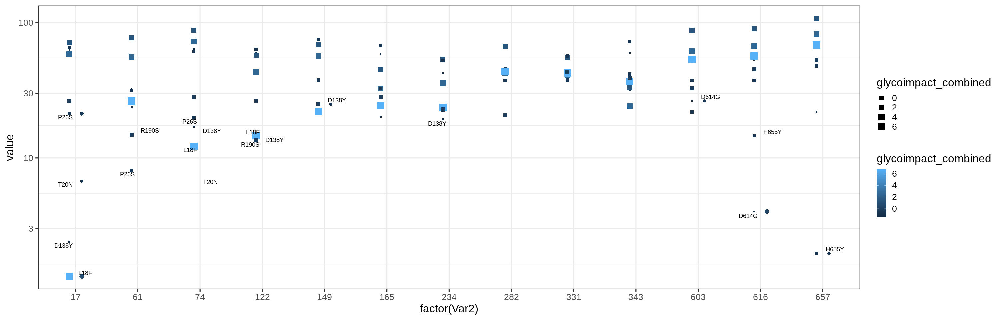

In [41]:
muts_keep = data.matrix(dist_all_s1$prediction_gamma[ mutated , ])
rownames(muts_keep) = muts$x[ muts$Brazil  ]
colnames(muts_keep) = s1_sites
muts_keep=merge(muts,melt(muts_keep),by.x='x',by.y='Var1')
head(muts_keep)

muts_keep$diff = muts_keep$Var2 - muts_keep$idx
muts_keep$dir = ifelse( abs(muts_keep$diff)>15, NA , ## 'aa',
                       ifelse( muts_keep$diff>0 , 'down' , 'up'))
muts_keep$glycoimpact_combined = ifelse( muts_keep$dir == 'aa' , muts_keep$glycoimpact_str ,
                                        ifelse( muts_keep$dir == 'down' , 
                                               muts_keep$glycoimpact_down, muts_keep$glycoimpact_up))
muts_keep$mannoseimpact_combined = ifelse( muts_keep$dir == 'aa' , muts_keep$mannoseimpact_str ,
                                        ifelse( muts_keep$dir == 'down' , 
                                               muts_keep$mannoseimpact_down, muts_keep$mannoseimpact_up))


options(repr.plot.width = 25, repr.plot.height = 8)

ggplot(muts_keep,aes(x=factor(Var2),y=value))+
    geom_point(aes(size=glycoimpact_combined,color=glycoimpact_combined),shape=16,position = position_nudge(x=.1))+
    geom_point(aes(size=glycoimpact_str,color=glycoimpact_str),shape=15,position = position_nudge(x=-.1))+
    geom_text_repel(aes(label=ifelse((abs(diff)<15)|value<20 ,x,NA)))+
    scale_y_continuous(trans='log10')+theme_bw(base_size = 20)


,x,wt,mt,idx,UK,Brazil,India,glycoimpact_seq,glycoimpact_up,glycoimpact_down,glycoimpact_str,mannoseimpact_seq,mannoseimpact_up,mannoseimpact_down,mannoseimpact_str,High_Impact,Var2,value
,<chr>,<chr>,<chr>,<dbl>,<lgl>,<lgl>,<lgl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>
1,D138Y,D,Y,138,FALSE,TRUE,FALSE,-0.7277393,-0.9288437,-0.898705,-1.399865,0.7551515,0.7753453,1.028124,0.3698629,NA,61,23.636788
2,D138Y,D,Y,138,FALSE,TRUE,FALSE,-0.7277393,-0.9288437,-0.898705,-1.399865,0.7551515,0.7753453,1.028124,0.3698629,NA,165,20.165971
3,D138Y,D,Y,138,FALSE,TRUE,FALSE,-0.7277393,-0.9288437,-0.898705,-1.399865,0.7551515,0.7753453,1.028124,0.3698629,NA,343,31.915454
4,D138Y,D,Y,138,FALSE,TRUE,FALSE,-0.7277393,-0.9288437,-0.898705,-1.399865,0.7551515,0.7753453,1.028124,0.3698629,NA,17,2.412709
5,D138Y,D,Y,138,FALSE,TRUE,FALSE,-0.7277393,-0.9288437,-0.898705,-1.399865,0.7551515,0.7753453,1.028124,0.3698629,NA,149,24.912548
6,D138Y,D,Y,138,FALSE,TRUE,FALSE,-0.7277393,-0.9288437,-0.898705,-1.399865,0.7551515,0.7753453,1.028124,0.3698629,NA,331,37.911677


x,wt,mt,idx,UK,Brazil,India,glycoimpact_seq,glycoimpact_up,glycoimpact_down,glycoimpact_str,mannoseimpact_seq,mannoseimpact_up,mannoseimpact_down,mannoseimpact_str,High_Impact,Var2,value
<chr>,<chr>,<chr>,<dbl>,<lgl>,<lgl>,<lgl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>
L18F,L,F,18,FALSE,TRUE,FALSE,0.9663272,0.8957942,-0.184696,6.784288,0.2641656,1.040885,0.4680981,0.7163232,1,17,1.33637
L18F,L,F,18,FALSE,TRUE,FALSE,0.9663272,0.8957942,-0.184696,6.784288,0.2641656,1.040885,0.4680981,0.7163232,1,74,12.16153
L18F,L,F,18,FALSE,TRUE,FALSE,0.9663272,0.8957942,-0.184696,6.784288,0.2641656,1.040885,0.4680981,0.7163232,1,122,14.60257
L18F,L,F,18,FALSE,TRUE,FALSE,0.9663272,0.8957942,-0.184696,6.784288,0.2641656,1.040885,0.4680981,0.7163232,1,149,22.04006
L18F,L,F,18,FALSE,TRUE,FALSE,0.9663272,0.8957942,-0.184696,6.784288,0.2641656,1.040885,0.4680981,0.7163232,1,234,23.62868
L18F,L,F,18,FALSE,TRUE,FALSE,0.9663272,0.8957942,-0.184696,6.784288,0.2641656,1.040885,0.4680981,0.7163232,1,165,24.34930
L18F,L,F,18,FALSE,TRUE,FALSE,0.9663272,0.8957942,-0.184696,6.784288,0.2641656,1.040885,0.4680981,0.7163232,1,61,26.33605
L18F,L,F,18,FALSE,TRUE,FALSE,0.9663272,0.8957942,-0.184696,6.784288,0.2641656,1.040885,0.4680981,0.7163232,1,343,36.55750
L18F,L,F,18,FALSE,TRUE,FALSE,0.9663272,0.8957942,-0.184696,6.784288,0.2641656,1.040885,0.4680981,0.7163232,1,331,42.33359


Warning message:
“Removed 26 rows containing missing values (geom_point).”
Warning message:
“Removed 113 rows containing missing values (geom_text_repel).”
Warning message:
“Removed 123 rows containing missing values (geom_point).”
Warning message:
“Removed 123 rows containing missing values (geom_text_repel).”
Warning message:
“Removed 123 rows containing missing values (geom_point).”
Warning message:
“Removed 127 rows containing missing values (geom_text_repel).”


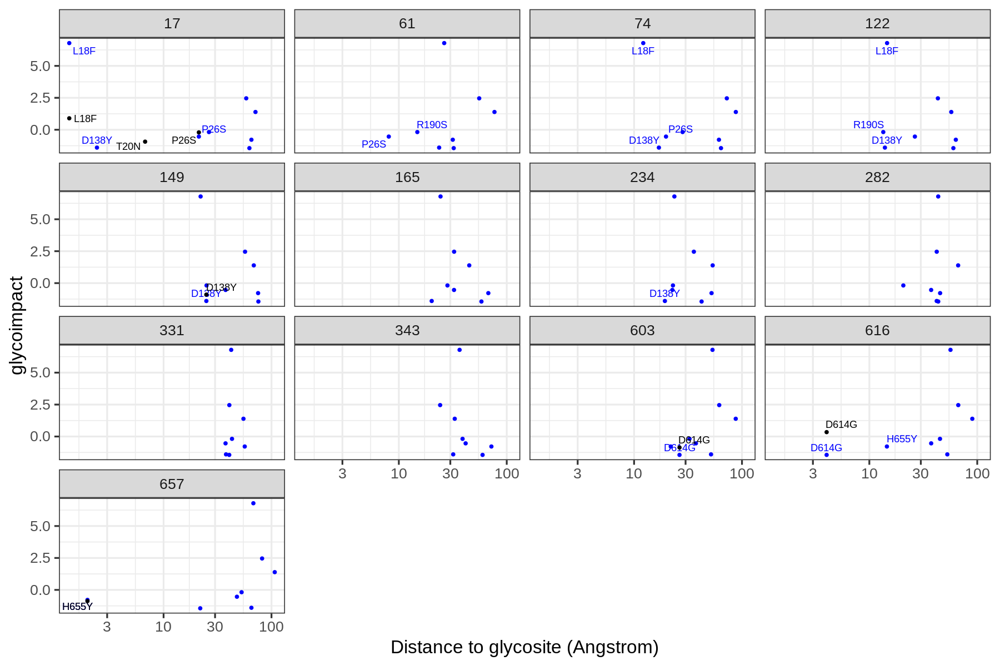

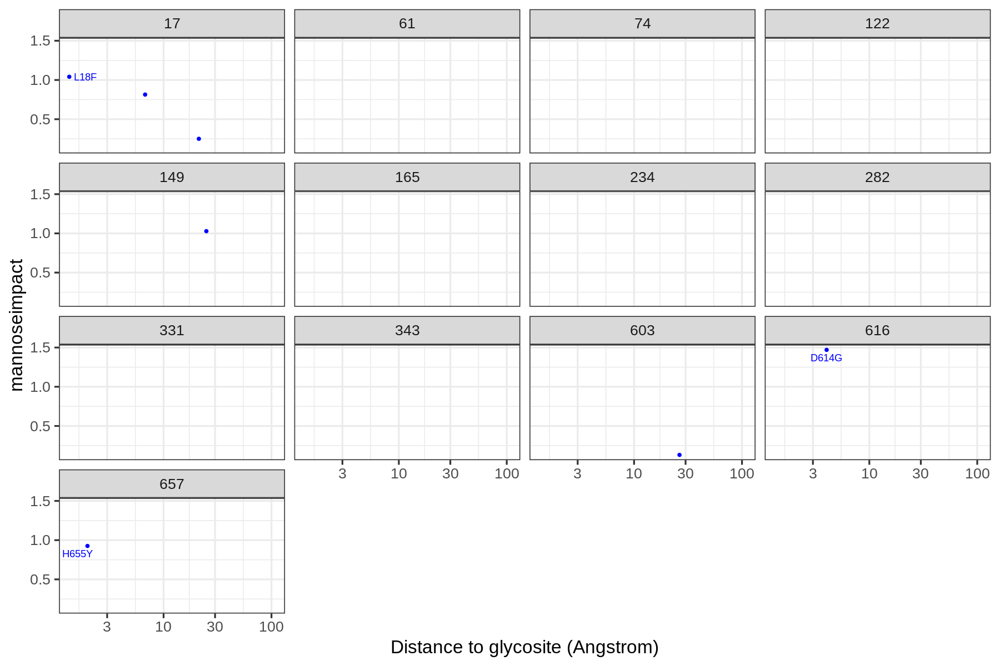

In [45]:
muts_keep = data.matrix(dist_all_s1$prediction_gamma[ mutated , ])
rownames(muts_keep) = muts$x[ muts$Brazil  ]
colnames(muts_keep) = s1_sites
muts_keep=merge(muts,melt(muts_keep),by.x='x',by.y='Var1')
head(muts_keep)

muts_keep%>%filter(Brazil&x=='L18F')%>%arrange(value)

muts_keep$diff = muts_keep$Var2 - muts_keep$idx
muts_keep$dir = ifelse( abs(muts_keep$diff)>15, NA , ## 'aa',
                       ifelse( muts_keep$diff>0 , 'down' , 'up'))
muts_keep$glycoimpact_combined = ifelse( muts_keep$dir == 'aa' , muts_keep$glycoimpact_str ,
                                        ifelse( muts_keep$dir == 'down' , 
                                               muts_keep$glycoimpact_down, muts_keep$glycoimpact_up))
muts_keep$mannoseimpact_combined = ifelse( muts_keep$dir == 'aa' , muts_keep$mannoseimpact_str ,
                                        ifelse( muts_keep$dir == 'down' , 
                                               muts_keep$mannoseimpact_down, muts_keep$mannoseimpact_up))

options(repr.plot.width = 15, repr.plot.height = 10)

muts_keep%>%filter(Brazil)%>%
    ggplot(aes(x=value))+
        geom_point(aes(y=glycoimpact_str),color='blue')+
        geom_text_repel(aes(y=glycoimpact_str,label=ifelse((value<20|abs(diff)<15) ,x,NA)),color='blue')+
        geom_point(aes(y=glycoimpact_combined),color='black')+
        geom_text_repel(aes(y=glycoimpact_combined,label=ifelse((value<20|abs(diff)<15) ,x,NA)),color='black')+
        ylab('glycoimpact')+xlab('Distance to glycosite (Angstrom)')+
        scale_x_continuous(trans='log10')+#geom_hline(yintercept = 2.5)+
        theme_bw(base_size = 20)+facet_wrap(~Var2)

muts_keep%>%filter(Brazil)%>%
    ggplot(aes(x=value,y=mannoseimpact_combined))+
        geom_point(color='blue')+ylab('mannoseimpact')+xlab('Distance to glycosite (Angstrom)')+
        geom_text_repel(aes(label=ifelse(value<20 & abs(mannoseimpact_combined)>.9,x,NA)),color='blue')+
        scale_x_continuous(trans='log10')+#geom_hline(yintercept = 2.5)+
        theme_bw(base_size = 20)+facet_wrap(~Var2)



In [46]:
options(repr.plot.width = 15, repr.plot.height = 15)

##### Brazil/Gamma
mutated=muts$idx[ muts$India  ] 
# glycoimpact_brazil = apply(muts[muts$Brazil,c('glycoimpact_seq','glycoimpact_str')],1,max,rm.na=T)
# colorRamp

# ht=heatmap.2(t((1/dist_all_s1$prediction_gamma[ mutated , ])),col=topo.colors,Rowv = F,Colv=F,
#              colSideColors = ifelse(muts$High_Impact[muts$Brazil]==1,'black','white'),
#              labCol = muts$x[ muts$Brazil  ],
#              labRow = s1_sites,cexRow=2,cexCol=2,mar=c(10,10))

palette = rev(topo.colors(10))
ramp = colorRampPalette(palette, bias = 8)

heatmaply(t((dist_all_s1$prediction_delta[ mutated , ])),
            # col_side_colors = muts[muts$India,
            #     c('glycoimpact_up','glycoimpact_down','glycoimpact_str',
            #       'mannoseimpact_up','mannoseimpact_down','mannoseimpact_str')],
            col=ramp,
            # col_side_palette=gplots::bluered,
            Rowv = F,Colv=F,
            labCol = muts$x[ muts$India  ],
            labRow = s1_sites#,cexRow=1.5,cexCol=1.5
)

muts_keep = dist_all_s1$prediction_delta[ mutated , ]
muts_keep


HTML widgets cannot be represented in plain text (need html)

2.775152,29.11542,11.87913,21.908640,27.39151,28.89869,28.31522,49.88027,53.57673,50.61927,57.53397,57.07132,67.47451
7.518274,29.30201,19.71911,7.481248,13.26807,21.83891,24.32058,39.84018,57.03445,49.80195,53.40462,60.25665,69.49653
8.134791,29.18881,23.34082,7.795760,16.20952,17.59601,20.90346,40.95742,52.98425,45.27568,54.96023,59.14302,70.16383
9.992727,25.58373,24.61926,6.566239,18.37775,14.53230,15.81005,36.08781,48.82113,41.14574,50.61768,55.17295,66.59452
11.270279,28.99385,27.26085,7.283986,19.23680,9.76433,15.81889,37.41924,48.24328,38.54152,53.54884,57.54932,69.84945
69.132495,66.91793,84.58055,60.825711,71.97669,41.49517,44.02157,63.10702,42.88474,23.01583,77.35345,72.42265,91.71924
84.426569,83.38740,100.26933,73.455695,83.52370,56.54542,60.77225,75.08075,61.46879,41.07167,90.90213,89.45517,107.79303
59.217853,28.24047,58.91356,58.930808,73.67455,58.27709,41.83774,46.81291,38.01158,58.50162,29.31347,0.00000,18.52543
65.510271,36.40147,55.68950,64.621616,72.54959,75.31929,62.91274,49.64914,74.09613,88.16290,27.07519,37.28050,19.05373


,x,wt,mt,idx,UK,Brazil,India,glycoimpact_seq,glycoimpact_up,glycoimpact_down,glycoimpact_str,mannoseimpact_seq,mannoseimpact_up,mannoseimpact_down,mannoseimpact_str,High_Impact,Var2,value
,<chr>,<chr>,<chr>,<dbl>,<lgl>,<lgl>,<lgl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>
1,D614G,D,G,614,TRUE,TRUE,TRUE,1.16029,-0.8615878,0.3427646,-1.440877,0.4007733,0.1313777,1.470366,0.7514684,NA,122,58.93081
2,D614G,D,G,614,TRUE,TRUE,TRUE,1.16029,-0.8615878,0.3427646,-1.440877,0.4007733,0.1313777,1.470366,0.7514684,NA,282,46.81291
3,D614G,D,G,614,TRUE,TRUE,TRUE,1.16029,-0.8615878,0.3427646,-1.440877,0.4007733,0.1313777,1.470366,0.7514684,NA,74,58.91356
4,D614G,D,G,614,TRUE,TRUE,TRUE,1.16029,-0.8615878,0.3427646,-1.440877,0.4007733,0.1313777,1.470366,0.7514684,NA,616,0.00000
5,D614G,D,G,614,TRUE,TRUE,TRUE,1.16029,-0.8615878,0.3427646,-1.440877,0.4007733,0.1313777,1.470366,0.7514684,NA,657,18.52543
6,D614G,D,G,614,TRUE,TRUE,TRUE,1.16029,-0.8615878,0.3427646,-1.440877,0.4007733,0.1313777,1.470366,0.7514684,NA,234,41.83774


x,wt,mt,idx,UK,Brazil,India,glycoimpact_seq,glycoimpact_up,glycoimpact_down,glycoimpact_str,mannoseimpact_seq,mannoseimpact_up,mannoseimpact_down,mannoseimpact_str,High_Impact,Var2,value
<chr>,<chr>,<chr>,<dbl>,<lgl>,<lgl>,<lgl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>
F157V,F,V,157,FALSE,FALSE,TRUE,0.7973072,5.435776,-0.920591,8.71513,0.1114602,0.063213,0.1844821,0.6806799,1,122,6.566239
F157V,F,V,157,FALSE,FALSE,TRUE,0.7973072,5.435776,-0.920591,8.71513,0.1114602,0.063213,0.1844821,0.6806799,1,17,9.992727
F157V,F,V,157,FALSE,FALSE,TRUE,0.7973072,5.435776,-0.920591,8.71513,0.1114602,0.063213,0.1844821,0.6806799,1,165,14.532301
F157V,F,V,157,FALSE,FALSE,TRUE,0.7973072,5.435776,-0.920591,8.71513,0.1114602,0.063213,0.1844821,0.6806799,1,234,15.810046
F157V,F,V,157,FALSE,FALSE,TRUE,0.7973072,5.435776,-0.920591,8.71513,0.1114602,0.063213,0.1844821,0.6806799,1,149,18.377748
F157V,F,V,157,FALSE,FALSE,TRUE,0.7973072,5.435776,-0.920591,8.71513,0.1114602,0.063213,0.1844821,0.6806799,1,74,24.619262
F157V,F,V,157,FALSE,FALSE,TRUE,0.7973072,5.435776,-0.920591,8.71513,0.1114602,0.063213,0.1844821,0.6806799,1,61,25.583732
F157V,F,V,157,FALSE,FALSE,TRUE,0.7973072,5.435776,-0.920591,8.71513,0.1114602,0.063213,0.1844821,0.6806799,1,282,36.087812
F157V,F,V,157,FALSE,FALSE,TRUE,0.7973072,5.435776,-0.920591,8.71513,0.1114602,0.063213,0.1844821,0.6806799,1,343,41.145743


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Removed 93 rows containing missing values (geom_text_repel).”
Warning message:
“Removed 107 rows containing missing values (geom_point).”
Warning message:
“Removed 107 rows containing missing values (geom_text_repel).”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Removed 107 rows containing missing values (geom_point).”
Warning message:
“Removed 114 rows containing missing values (geom_text_repel).”


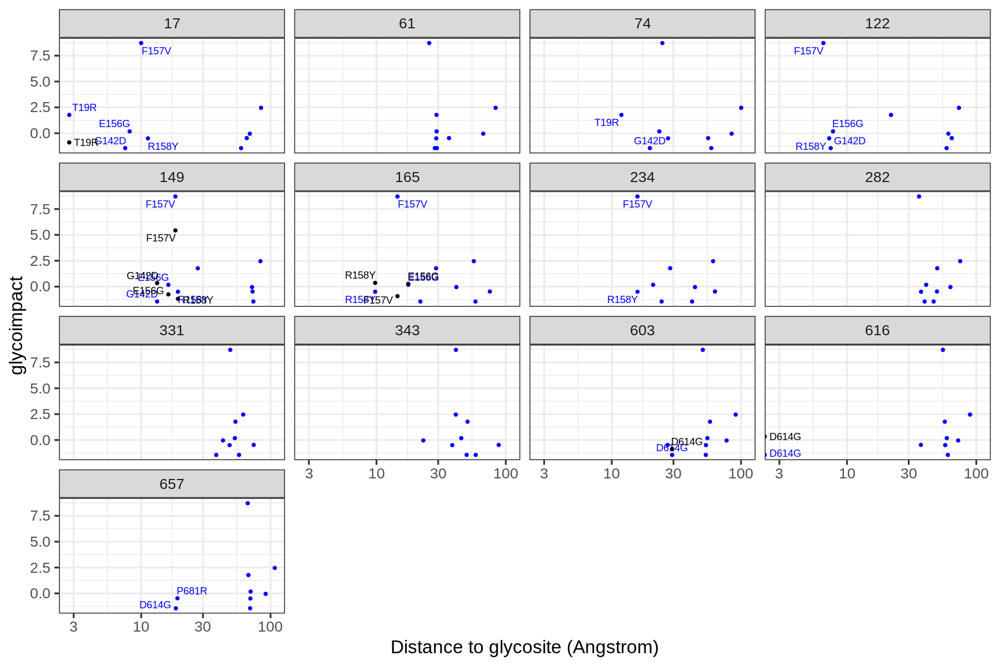

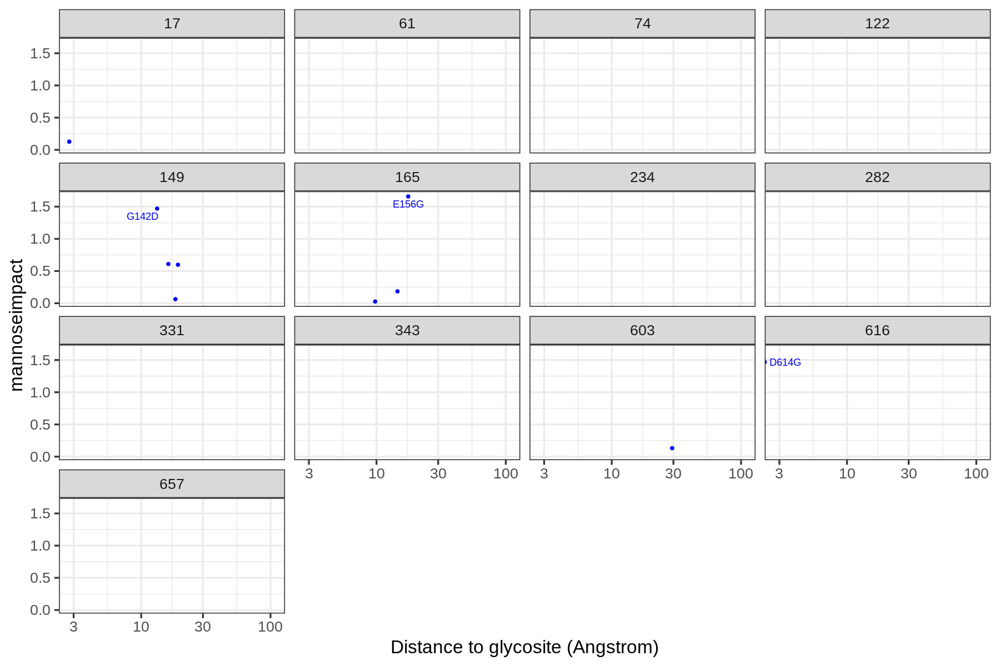

In [49]:
muts_keep = data.matrix(dist_all_s1$prediction_delta[ mutated , ])
rownames(muts_keep) = muts$x[ muts$India  ]
colnames(muts_keep) = s1_sites
muts_keep=merge(muts,melt(muts_keep),by.x='x',by.y='Var1')
head(muts_keep)


muts_keep%>%filter(India&x=='F157V')%>%arrange(value)

diff = muts_keep$Var2 - muts_keep$idx
muts_keep$dir = ifelse( abs(diff)>15, NA ,
                       ifelse( diff>0 , 'down' , 'up'))
muts_keep$glycoimpact_combined = ifelse( muts_keep$dir == 'aa' , muts_keep$glycoimpact_str ,
                                        ifelse( muts_keep$dir == 'down' , 
                                               muts_keep$glycoimpact_down, muts_keep$glycoimpact_up))
muts_keep$mannoseimpact_combined = ifelse( muts_keep$dir == 'aa' , muts_keep$mannoseimpact_str ,
                                        ifelse( muts_keep$dir == 'down' , 
                                               muts_keep$mannoseimpact_down, muts_keep$mannoseimpact_up))

options(repr.plot.width = 15, repr.plot.height = 10)

muts_keep%>%filter(India)%>%
    ggplot(aes(x=value))+
        geom_point(aes(y=glycoimpact_str),color='blue')+
        geom_text_repel(aes(y=glycoimpact_str,label=ifelse((value<20|abs(diff)<15) ,x,NA)),color='blue')+
        geom_point(aes(y=glycoimpact_combined),color='black')+
        geom_text_repel(aes(y=glycoimpact_combined,label=ifelse((value<20|abs(diff)<15) ,x,NA)),color='black')+
        ylab('glycoimpact')+xlab('Distance to glycosite (Angstrom)')+
        scale_x_continuous(trans='log10')+#geom_hline(yintercept = 2.5)+
        theme_bw(base_size = 20)+facet_wrap(~Var2)


muts_keep%>%filter(India)%>%
    ggplot(aes(x=value,y=mannoseimpact_combined))+
        geom_point(color='blue')+ylab('mannoseimpact')+xlab('Distance to glycosite (Angstrom)')+
        geom_text_repel(aes(label=ifelse(value<20 & abs(mannoseimpact_combined)>.9,x,NA)),color='blue')+
        scale_x_continuous(trans='log10')+#geom_hline(yintercept = 2.5)+
        theme_bw(base_size = 20)+facet_wrap(~Var2)

# InSaNNe Predictions

`geom_smooth()` using formula 'y ~ x'



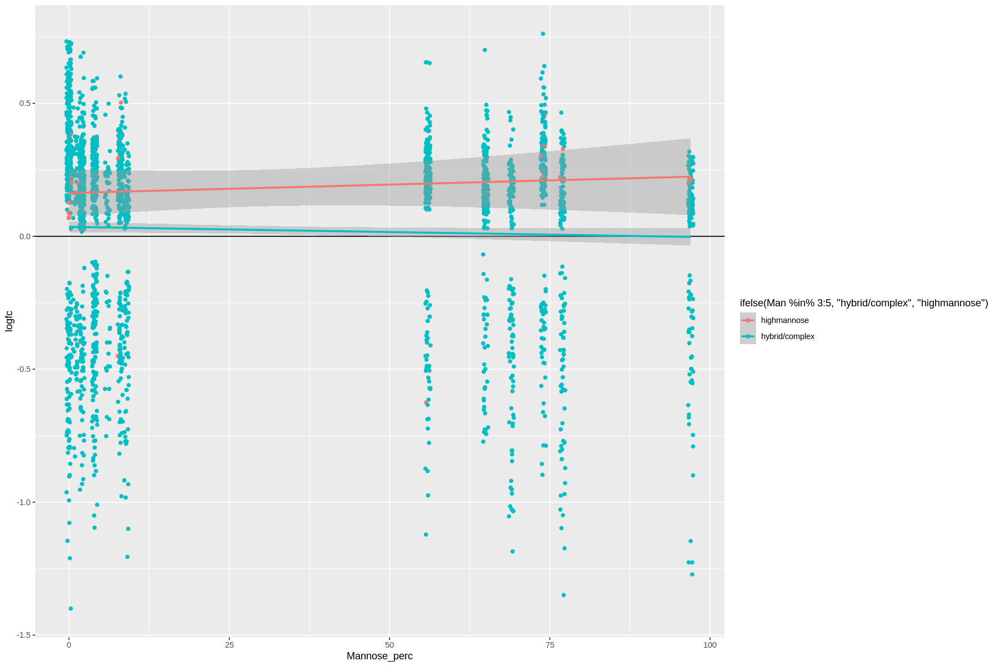

site,Mannose_perc,highmannose,highmannose_pred,complex,mannose_complex
<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>
17,4,0.0000000,0.00000000,0.27023561,0.0000000
61,69,0.0000000,0.00000000,0.06653591,0.0000000
74,4,0.1186908,0.31771573,-0.16978022,-1.7009237
122,56,-0.3125252,0.05434936,0.21329755,-0.9975348
149,8,0.2933277,0.32016327,0.14886137,1.1786791
165,0,0.1818545,0.40273584,0.23598442,0.5412588


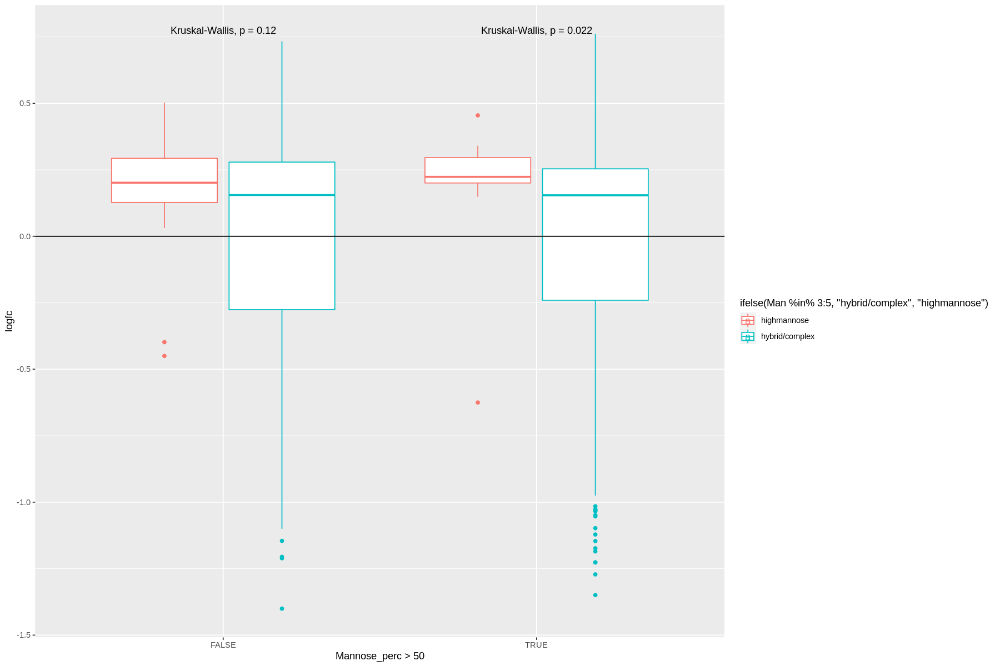

In [50]:
#####
insane = read.csv('../GTspecificity/InSaNNE_standalone/files/data-intermediate/SARS_CoV_2_spike.wt_pred.csv')


options(repr.plot.width=15,repr.plot.height=10)
insane %>%
  filter( pp_base>.1 & q<.1 & Man%in%c(3:5,8:9)) %>%
  ggplot(aes(x=Mannose_perc,y=logfc,color=ifelse(Man%in%3:5,'hybrid/complex','highmannose')))+
  geom_jitter()+geom_hline(yintercept = 0)+
  stat_smooth(method='glm')

insane %>%
  filter( pp_base>.1 & q<.1 & Man%in%c(3:5,8:9)) %>%
  ggplot(aes(x=Mannose_perc>50,y=logfc,color=ifelse(Man%in%3:5,'hybrid/complex','highmannose')))+
  geom_boxplot()+geom_hline(yintercept = 0)+
  stat_compare_means()

tmp=insane %>%
  group_by(site) %>%
  filter( pp_base>.1 & q<.1 & Man%in%c(3:5,8:9)) %>%
  summarize(Mannose_perc=unique(Mannose_perc),
            highmannose=median(c(0,logfc[Man%in%c(9)]),na.rm=T),
            highmannose_pred=median(c(0,pp_base[Man%in%c(9)]),na.rm=T),
            complex=median(logfc[Man%in%c(3)]),
            mannose_complex=median(c(0,logfc[Man%in%c(9)]),na.rm=T)/median(logfc[Man%in%c(3)]+.1,na.rm=T))
head(tmp)

[[1]]
[1] 0.7380952

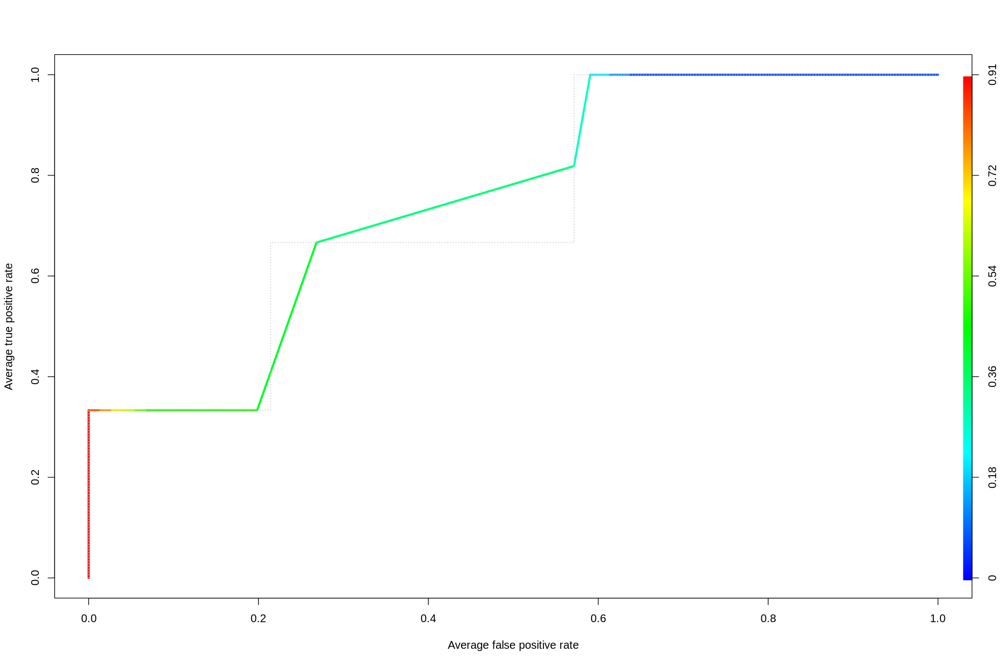

In [51]:
pred <- prediction(tmp$highmannose_pred, tmp$Mannose_perc>70)
                   
perf <- performance(pred, "tpr", "fpr")
plot(perf,avg= "threshold",colorize=TRUE,lwd= 3)
plot(perf,lty=3,col="grey78",add=TRUE)

perf=performance(pred, "auc")
perf@y.values

[1] 616
, , mutant = YQGVNCTEVP

       Man_col
        Complex HighMannose Hybrid
  FALSE      30           6      1
  TRUE        7           2      3

[1] 343
, , mutant = GEIFNATRFA

       Man_col
        Complex HighMannose Hybrid
  FALSE     117          12     16
  TRUE       82           0      1

, , mutant = GEVFNSTRFA

       Man_col
        Complex HighMannose Hybrid
  FALSE      27           2      4
  TRUE       13           0      0

, , mutant = GEVLNATRFA

       Man_col
        Complex HighMannose Hybrid
  FALSE     143           7     13
  TRUE       38           3      4

[1] 17
, , mutant = SQCVNFTNRT

       Man_col
        Complex HighMannose Hybrid
  FALSE      95           0      0
  TRUE       77           9     11

, , mutant = SQCVNLRTRT

       Man_col
        Complex HighMannose Hybrid
  FALSE      33           0      2
  TRUE       72           0      7

[1] 657
, , mutant = AEYVNNSYEC

       Man_col
        Complex HighMannose Hybrid
  FALSE      56   

Warning message:
“stat_contour(): Zero contours were generated”
Warning message in min(x):
“no non-missing arguments to min; returning Inf”
Warning message in max(x):
“no non-missing arguments to max; returning -Inf”
Warning message:
“stat_contour(): Zero contours were generated”
Warning message in min(x):
“no non-missing arguments to min; returning Inf”
Warning message in max(x):
“no non-missing arguments to max; returning -Inf”
Warning message:
“stat_contour(): Zero contours were generated”
Warning message in min(x):
“no non-missing arguments to min; returning Inf”
Warning message in max(x):
“no non-missing arguments to max; returning -Inf”
Warning message:
“stat_contour(): Zero contours were generated”
Warning message in min(x):
“no non-missing arguments to min; returning Inf”
Warning message in max(x):
“no non-missing arguments to max; returning -Inf”
Warning message:
“stat_contour(): Zero contours were generated”
Warning message in min(x):
“no non-missing arguments to min; returni

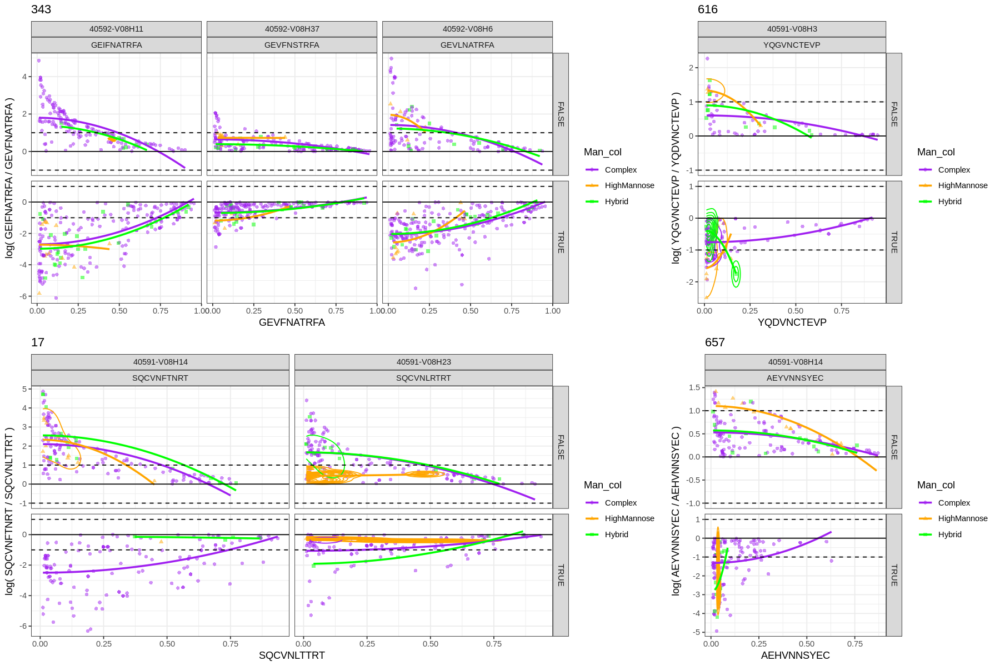

In [52]:


insane2 = read.csv('InSaNNE_standalone/files/data-intermediate/SARS_CoV_2_spike.variant_pred.csv')%>%
  mutate(Man_col=ifelse(Man==3,'Complex',ifelse(Man%in%c(4,5),'Hybrid',
                    ifelse(Man%in%c(6:9),'HighMannose',NA)))) %>%
  filter(!is.na(Man_col) & predicted_presence_y>.01)
#plots_all=list()

pltz=  lapply(
  unique(insane2$site),function(si){
    print(si)
    tmp = droplevels(insane2[insane2$site==si,])
    if(si==616){ tmp=droplevels(tmp[tmp$var==tmp$var[1],]) }
    tab = with(tmp[abs(tmp$logFC)>1,], table(logFC>0,Man_col,mutant))
    print(tab)
    ggplot(tmp,aes(x=predicted_presence_y,y=logFC,color=Man_col,shape=Man_col))+
      geom_point(alpha=.5)+
      stat_density_2d()+
      stat_smooth(#aes(weight=abs(logFC)*((predicted_presence_x-predicted_presence_y)^2)),
                  method='lm',formula= y~I(x^2),se=F)+
                  #method='lm',formula= y~x+I(x^2),se=F)+
  #method='loess',span=10,se = F)+
      scale_color_manual(values = c('purple','orange','green'))+
      xlab(unique(tmp$wt))+ylab(paste('log(',unique(tmp$mutant),'/',unique(tmp$wt),')'))+
      theme_bw()+facet_grid(logFC<0~var+mutant,scales = 'free_y')+ggtitle(unique(tmp$site))+
      geom_hline(yintercept = 0)+geom_hline(yintercept = 1,lty=2)+geom_hline(yintercept = -1,lty=2)
  }
)

p=plot_grid(
  plot_grid(plotlist = pltz[2:3],nrow=2),
  plot_grid(plotlist = pltz[c(1,4)],nrow=2),
  ncol=2,rel_widths = c(2,1)
)
print(p)
ggsave(p,filename = '../GTspecificity/InSaNNE_standalone/files/results/SPIKE_Validation/mannose_complex_change.byvariant.pdf')


[1] 616
, , mutant = YQGVNCTEVP

       Man_col
        Complex HighMannose Hybrid
  FALSE      30           6      1
  TRUE        7           2      3

[1] 343
, , mutant = GEIFNATRFA

       Man_col
        Complex HighMannose Hybrid
  FALSE     117          12     16
  TRUE       82           0      1

, , mutant = GEVFNSTRFA

       Man_col
        Complex HighMannose Hybrid
  FALSE      27           2      4
  TRUE       13           0      0

, , mutant = GEVLNATRFA

       Man_col
        Complex HighMannose Hybrid
  FALSE     143           7     13
  TRUE       38           3      4

[1] 17
, , mutant = SQCVNFTNRT

       Man_col
        Complex HighMannose Hybrid
  FALSE      95           0      0
  TRUE       77           9     11

, , mutant = SQCVNLRTRT

       Man_col
        Complex HighMannose Hybrid
  FALSE      33           0      2
  TRUE       72           0      7

[1] 657
, , mutant = AEYVNNSYEC

       Man_col
        Complex HighMannose Hybrid
  FALSE      56   

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'



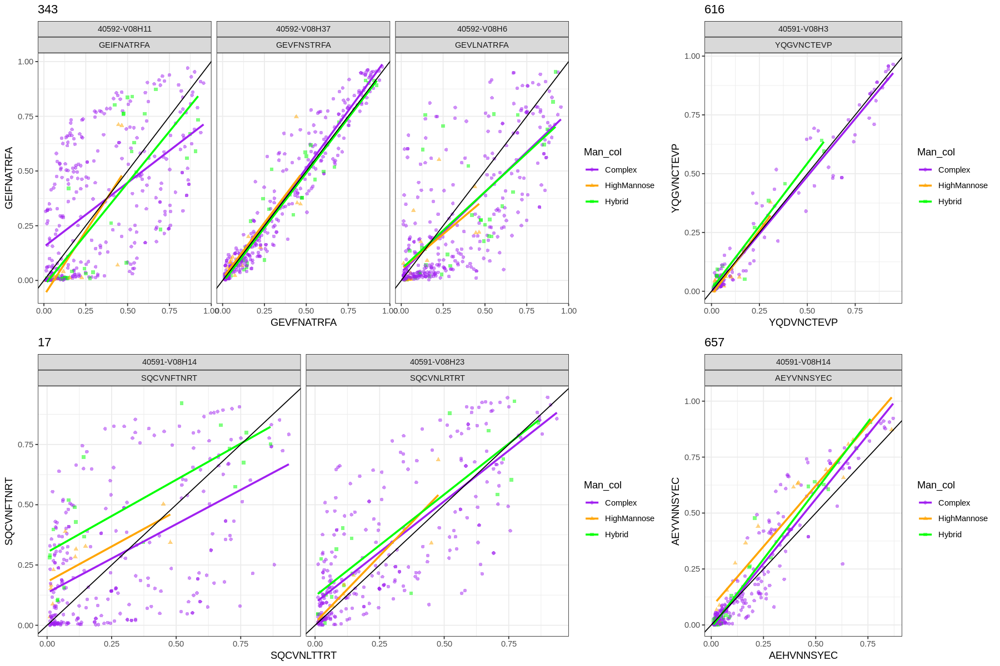

In [53]:
pltz=  lapply(
  unique(insane2$site),function(si){
    print(si)
    tmp = droplevels(insane2[insane2$site==si,])
    if(si==616){ tmp=droplevels(tmp[tmp$var==tmp$var[1],]) }
    tab = with(tmp[abs(tmp$logFC)>1,], table(logFC>0,Man_col,mutant))
    print(tab)
    ggplot(tmp,aes(x=predicted_presence_y,y=predicted_presence_x,color=Man_col,shape=Man_col))+
      geom_point(alpha=.5)+
      stat_smooth(method='lm',se=F)+
      #stat_smooth(method='loess',span=50,se = F)+
      scale_color_manual(values = c('purple','orange','green'))+
      xlab(unique(tmp$wt))+ylab(unique(tmp$mutant))+
      theme_bw()+facet_wrap(~var+mutant)+ggtitle(unique(tmp$site))+
      geom_abline(slope = 1,intercept = 0)
  }
)

plot_grid(
  plot_grid(plotlist = pltz[2:3],nrow=2),
  plot_grid(plotlist = pltz[c(1,4)],nrow=2),
  ncol=2,rel_widths = c(2,1)
)


# Differential Glycosylation

## Measured

Warning message:
“Removed 3 rows containing missing values (position_stack).”
Warning message:
“Removed 3 rows containing missing values (position_stack).”
Warning message:
“Removed 3 rows containing missing values (position_stack).”


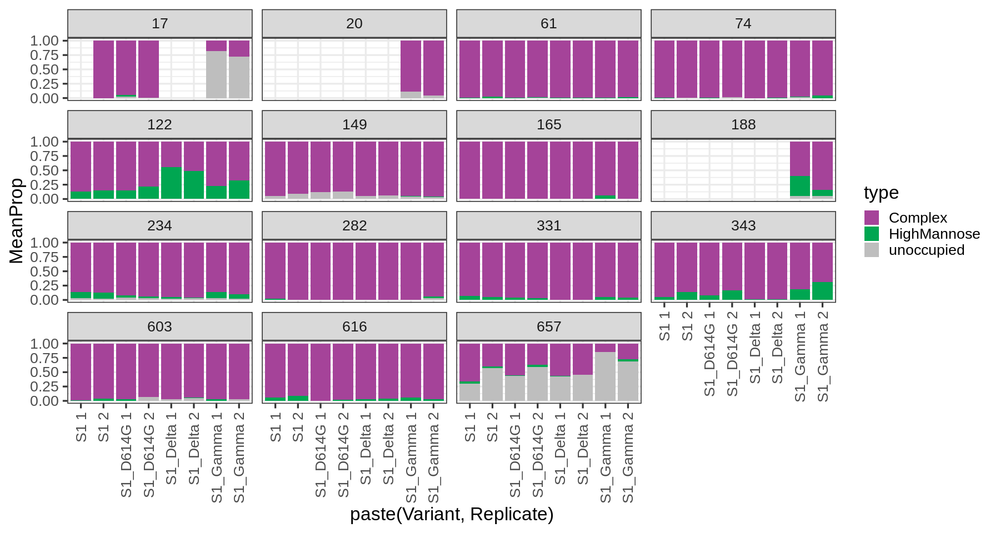

Warning message:
“Removed 3 rows containing missing values (position_stack).”


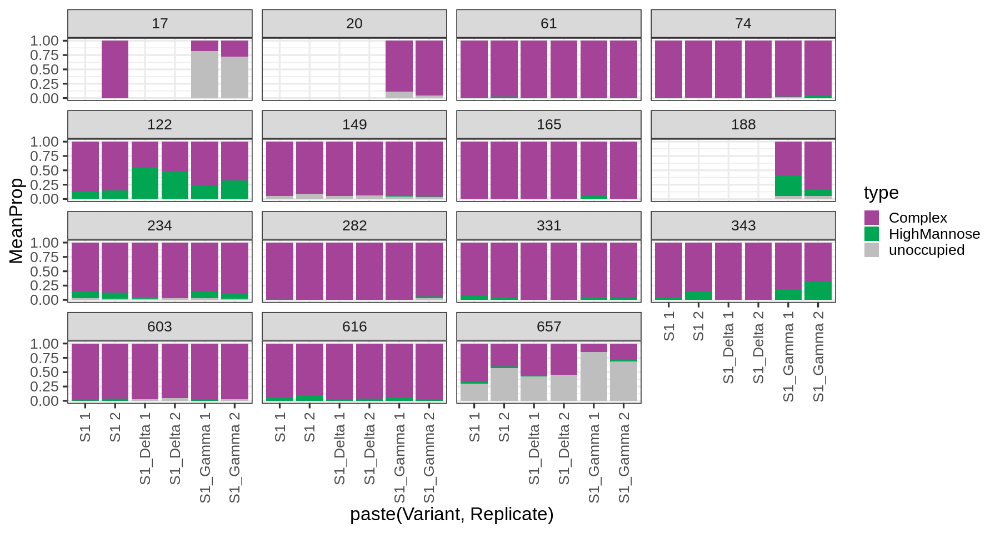

In [106]:
options(repr.plot.width = 15, repr.plot.height = 8)

#############
ggplot(prop[grepl('S1',prop$Variant),],aes(x=paste(Variant,Replicate),y=MeanProp,fill=type))+
  geom_bar(stat='identity')+facet_wrap(~factor(N.glycosylation.site.))+
  #  geom_pointrange(aes(ymax=MeanProp+SEM,ymin=MeanProp-SEM))+
  scale_fill_manual(values=c('#a54399','#00a651','grey'))+theme_bw(base_size=20)+
  theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))


ggsave(file='figures/04.specific_questions/sarscov2/prop_all.pdf',height=8,width=15)

ggplot(prop[grepl('S1$|S1_Ga|S1_De',prop$Variant),],aes(x=paste(Variant,Replicate),y=MeanProp,fill=type))+
  geom_bar(stat='identity')+facet_wrap(~factor(N.glycosylation.site.))+
  #  geom_pointrange(aes(ymax=MeanProp+SEM,ymin=MeanProp-SEM))+
  scale_fill_manual(values=c('#a54399','#00a651','grey'))+theme_bw(base_size=20)+
  theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))

ggsave(file='figures/04.specific_questions/sarscov2/prop_delta_gamma.pdf',height=8,width=15)

######################

Position,PTM,group1,group2,X..1,X..2,SEM.1,SEM.2,p.value
<int>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
17,Complex,S1,S1_D614G,0.992375008,1.0000000,0.007624992,NA,0.9941379921
17,Complex,S1,S1_Gamma,0.273424964,1.0000000,0.083279514,NA,0.3713941473
17,Complex,S1_D614G,S1_Gamma,0.950313289,0.1782212,0.047110903,0.08353575,0.0009582364
17,HighMannose,S1,S1_D614G,0.000000000,0.0000000,0.000000000,NA,1.0000000000
17,HighMannose,S1,S1_Gamma,0.001011237,0.0000000,0.001011237,NA,0.9975557110
17,HighMannose,S1_D614G,S1_Gamma,0.024156188,0.0000000,0.021648232,0.00000000,0.5145536144


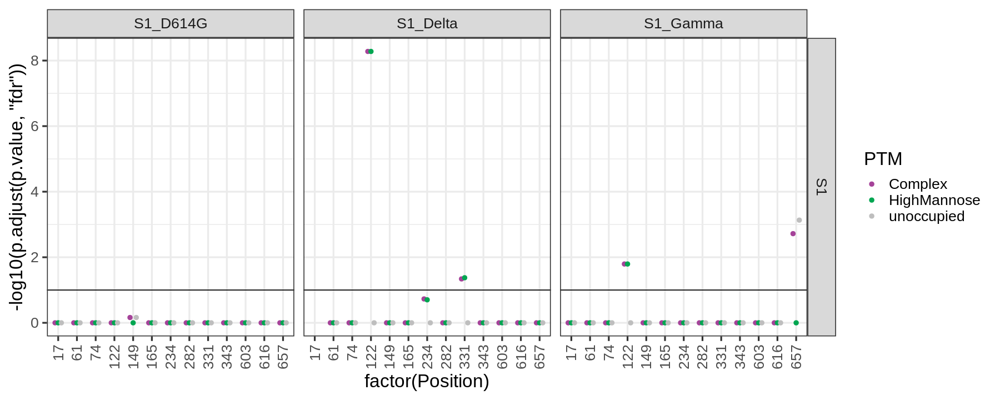

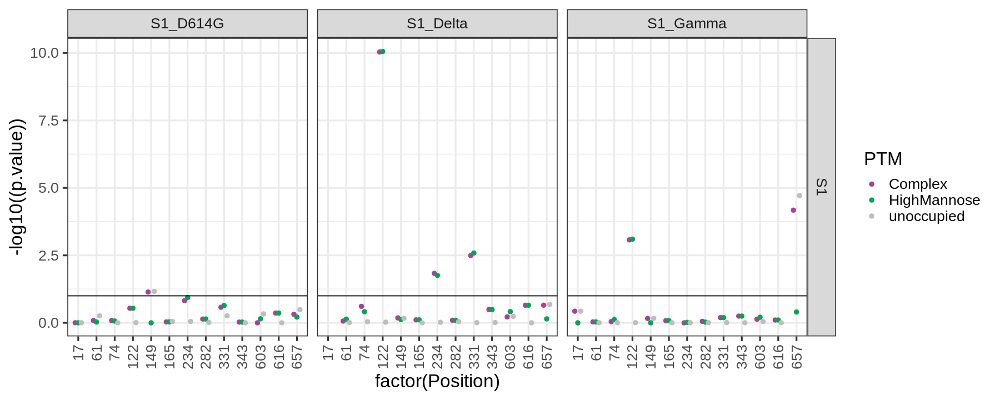

In [55]:
head(comp2)

options(repr.plot.width = 15, repr.plot.height = 6)

# ggplot(comp2[comp2$group1=='S1',],
#        aes(x=factor(Position),y=-log10(p.value),color=type))+
#        geom_point()+
#        scale_color_manual(values=c('#a54399','#00a651','grey'))+theme_bw(base_size=15)+
#        facet_grid(~group2)

ggplot(comp2[comp2$group1=='S1',],
       aes(x=factor(Position),y=-log10(p.adjust(p.value,'fdr')),color=PTM))+
       geom_point(size=2,position=position_dodge2(width = .5))+
       scale_color_manual(values=c('#a54399','#00a651','grey'))+
       facet_grid(group1~group2)+geom_hline(yintercept = 1)+theme_bw(base_size=20)+
        theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))


ggplot(comp2[comp2$group1=='S1',],
       aes(x=factor(Position),y=-log10((p.value)),color=PTM))+
       geom_point(size=2,position=position_dodge2(width = .5))+
       scale_color_manual(values=c('#a54399','#00a651','grey'))+
       facet_grid(group1~group2)+geom_hline(yintercept = 1)+theme_bw(base_size=20)+
        theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))

In [110]:
comp3 = comp2

tmp = with(comp3,ifelse(X..1>X..2,X..1,X..2))
comp3$X..2 = with(comp3,ifelse(X..1>X..2,X..2,X..1))
comp3$X..1=tmp

comp3 %>% filter(group1=='S1') %>% group_by(PTM) %>%
    mutate(fdr=p.adjust(p.value,'fdr'),
          diff=X..1-X..2,
          lfc=log2(X..1/X..2)) %>% filter(fdr<.1) %>% arrange(group2,Position,PTM)

# comp %>% filter(group1=='S1'&Position==122&group2=='S1_Gamma') %>% arrange(Position,PTM)
# # head(prop)
# prop %>% filter(Variant%in%c('S1','S1_Gamma') & N.glycosylation.site.==122) %>% arrange(Replicate,N.glycosylation.site.,type,Variant)

Position,PTM,group1,group2,X..1,X..2,SEM.1,SEM.2,p.value,fdr,diff,lfc
<int>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
122,Complex,S1,S1_Delta,0.87423129,0.474757727,0.03583388,0.0568752298,9.235056e-11,3.509321e-09,0.39947356,0.88082354
122,HighMannose,S1,S1_Delta,0.52520087,0.125515979,0.03584351,0.0568726126,8.803515e-11,3.345336e-09,0.39968489,2.06499827
331,Complex,S1,S1_Delta,0.99711549,0.937702517,0.02197895,0.0009132248,3.214186e-03,3.053476e-02,0.05941297,0.08863031
331,HighMannose,S1,S1_Delta,0.06220055,0.002807191,0.02197397,0.0009047582,2.590702e-03,3.281556e-02,0.05939336,4.46972848
122,Complex,S1,S1_Gamma,0.79374359,0.776996561,0.04775195,0.0462709200,8.456755e-04,1.071189e-02,0.01674703,0.03076482
122,HighMannose,S1,S1_Gamma,0.22300344,0.206003680,0.04775195,0.0462805532,7.929693e-04,1.506642e-02,0.01699976,0.11439584
657,Complex,S1,S1_Gamma,0.45229918,0.265296658,0.07095980,0.0693781846,6.686001e-05,1.270340e-03,0.18700253,0.76967089
657,unoccupied,S1,S1_Gamma,0.72169351,0.508827362,0.07125766,0.0691074641,1.937616e-05,7.362942e-04,0.21286615,0.50421003


In [107]:
prop %>% filter(Variant%in%c('S1','S1_Gamma') & N.glycosylation.site.%in%c(122,331,343,657)) %>%
    dcast(N.glycosylation.site.+Replicate+type~Variant,value.var = 'MeanProp') %>% group_by(N.glycosylation.site.,type)%>%
        summarize(
            S1 = mean(S1),
            S1_Gamma=mean(S1_Gamma)
        )%>%
        mutate(
               diff_S1_gamma = S1_Gamma-S1,
               lfc_S1_gamma = log2(S1_Gamma/S1))



prop %>% filter(Variant%in%c('S1','S1_Delta') & N.glycosylation.site.%in%c(122,331,343,657)) %>%
    dcast(N.glycosylation.site.+Replicate+type~Variant,value.var = 'MeanProp') %>% group_by(N.glycosylation.site.,type)%>%
        summarize(
            S1 = mean(S1),
            S1_Delta=mean(S1_Delta)
        )%>%
        mutate(diff_S1_delta = S1_Delta-S1,
               lfc_S1_delta = log2(S1_Delta/S1))




`summarise()` has grouped output by 'N.glycosylation.site.'. You can override using the `.groups` argument.



N.glycosylation.site.,type,S1,S1_Gamma,diff_S1_gamma,lfc_S1_gamma
<int>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
122,Complex,0.860575,0.723505,-0.137070,-0.25029794
122,HighMannose,0.139170,0.276495,0.137325,0.99040514
122,unoccupied,0.000255,0.000000,-0.000255,-Inf
331,Complex,0.937705,0.956125,0.018420,0.02806512
331,HighMannose,0.062200,0.043835,-0.018365,-0.50483133
331,unoccupied,0.000095,0.000040,-0.000055,-1.24792751
343,Complex,0.905045,0.749175,-0.155870,-0.27268677
343,HighMannose,0.094500,0.250820,0.156320,1.40826616
343,unoccupied,0.000455,0.000000,-0.000455,-Inf


`summarise()` has grouped output by 'N.glycosylation.site.'. You can override using the `.groups` argument.



N.glycosylation.site.,type,S1,S1_Delta,diff_S1_delta,lfc_S1_delta
<int>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
122,Complex,0.860575,0.475100,-0.385475,-0.857069723
122,HighMannose,0.139170,0.524860,0.385690,1.915084401
122,unoccupied,0.000255,0.000040,-0.000215,-2.672425342
331,Complex,0.937705,0.997115,0.059410,0.088625779
331,HighMannose,0.062200,0.002805,-0.059395,-4.470841904
331,unoccupied,0.000095,0.000080,-0.000015,-0.247927513
343,Complex,0.905045,0.985350,0.080305,0.122646740
343,HighMannose,0.094500,0.014650,-0.079850,-2.689413665
343,unoccupied,0.000455,0.000000,-0.000455,-Inf
